<h1>Analytics for the win</h1>

It is hard to make decisions without looking into data. Fortunately we have taxi ride data available. Furthermore, we have had interviews with users to understand how they think about our business idea. We already had a look into it while we discussed our OKR and the data strategy in the first chapter, because data is the basis for our decisions there.

<u><h3>Here are the steps that we are going to take:</h3></u>

1. Import required libraries and read data (rides & research)
2. Take a first look on the data with Pandas Profiling
3. Data Cleaning and Data Enrichment
    - 3.1 Check out how the variable distance and duration is measured
    - 3.2 Transform variables
    - 3.3 Identifying Outliers
    - 3.4 Adding information to the dataset
4. Prepare Final Dataset and further steps

<h4>1. Import required libraries and read data (rides & research)</h4>

In [1]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
rides=pd.read_csv('taxi_rides.csv')
research=pd.read_csv('user-research.csv')

In [3]:
rides.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,duration,distance,Unnamed: 12,Unnamed: 13,Unnamed: 14
0,id3487442,2,2/29/16 18:39,2/29/16 18:42,1,-73.981819,40.768963,-73.981819,40.768963,N,227,0.0,NaN,NaN,NaN
1,id1145809,2,5/16/16 23:15,5/16/16 23:31,6,-73.808487,40.687336,-73.808487,40.687336,N,947,0.0,NaN,NaN,NaN
2,id3499387,1,1/25/16 19:45,1/25/16 19:54,1,-73.786720,40.647041,-73.786720,40.647041,N,580,0.0,NaN,NaN,NaN
3,id0753277,1,1/27/16 22:29,1/27/16 22:29,1,-74.209854,40.816853,-74.209854,40.816853,N,27,0.0,NaN,NaN,NaN
4,id2134482,1,1/22/16 16:13,1/22/16 16:13,1,-73.776314,40.645454,-73.776314,40.645454,N,19,0.0,NaN,NaN,NaN


<h4>2. Take a first look on the data with Pandas Profiling</h4>

While the import worked out we will focus first on the rides data and run a quick pre EDA by using Pandas Profiling. It generates a report which explains overall information about the dataset.

In [4]:
rides_eda = ProfileReport(rides)
rides_eda

Summarize dataset:   0%|          | 0/29 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<u>There is quite some information that we can summarize so far:</u>
 - there are 15 columns and 1,048,468 rows. 3 further columns without any entries have been neglected 
 - each record represents one ride
 - the column ‘Id’ is the primary key
 - looking at the timestamp data we see that the dataset contain rides from 1 January 2016 until 1 July 2016:

In [5]:
min(rides.pickup_datetime)

'1/1/16 0:00'

In [6]:
max(rides.dropoff_datetime)

'7/1/16 7:46'

<h4>3. Data Cleaning and Data Enrichment</h4>

- 3.1 Check out how the variable distance and duration is measured
- 3.2 Transform variables
- 3.3 Identifying Outliers
- 3.4 Adding information to the dataset

<h5>3.1 Check out how the variable distance and duration is measured</h5>
Looking first at the distance, we have seen distances with a value of 0. That seems a bit odd and therefore we look at some proper 'distance' values.

In [7]:
rides.loc[(rides.distance != 0)].tail(400)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,duration,distance,Unnamed: 12,Unnamed: 13,Unnamed: 14
1048068,id2197698,1,5/22/16 15:35,5/22/16 16:32,1,-73.782143,40.644707,-73.761978,40.921700,N,3413,30.846950,NaN,NaN,NaN
1048069,id2171976,1,6/20/16 19:15,6/20/16 20:01,1,-73.790245,40.646767,-73.827812,40.922722,N,2725,30.847398,NaN,NaN,NaN
1048070,id2187456,1,4/17/16 12:59,4/17/16 13:44,2,-73.974411,40.762699,-74.338799,40.734337,Y,2649,30.857297,NaN,NaN,NaN
1048071,id3436478,2,1/18/16 22:00,1/18/16 22:41,1,-73.788849,40.647091,-73.900978,40.911350,N,2427,30.863813,NaN,NaN,NaN
1048072,id1093818,1,1/15/16 20:42,1/15/16 21:24,1,-73.974808,40.751686,-74.214523,40.541496,N,2553,30.907544,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1048463,id0982904,1,4/28/16 13:32,4/28/16 14:14,2,-73.870682,40.773598,-79.817978,38.963852,N,2515,545.853499,NaN,NaN,NaN
1048464,id1001696,1,2/24/16 21:02,2/24/16 21:25,1,-73.972366,40.758633,-79.553535,43.674000,N,1405,562.235188,NaN,NaN,NaN
1048465,id1146400,1,2/15/16 18:57,2/15/16 19:02,2,-73.989914,40.756634,-70.346077,36.398121,N,303,578.842818,NaN,NaN,NaN
1048466,id1510552,2,1/6/16 20:40,1/6/16 20:51,5,-71.799896,35.081532,-79.352837,40.436329,N,611,891.214103,NaN,NaN,NaN


We choose randomly some rides and double checked pickup and dropoff locations with google maps (see file 2.2). You can see that the distance is measured in miles rather than in km. Looking at the distance you can also see that it is not properly formatted. Checking on the timestamps and the duration, it is clear that duration is measured in seconds.

<h5>3.2 Transform variables</h5>
We want to: 

In [8]:
#format the datatype of variable 'distance'
rides.distance.astype('float64')

0             0.000000
1             0.000000
2             0.000000
3             0.000000
4             0.000000
              ...     
1048463     545.853499
1048464     562.235188
1048465     578.842818
1048466     891.214103
1048467    1240.908677
Name: distance, Length: 1048468, dtype: float64

In [9]:
#add a new column to tranform 'duration' from seconds to minutes
rides['duration_in_min']=rides.duration/60

<h5>3.3 Identifying Outliers</h5>

Looking at the values of 'duration_in_min' and the 'distance' some of the rides seems to be out of line. Lets have a look on their data distribution:

count    1.048468e+06
mean     1.603659e+01
std      9.755495e+01
min      1.666667e-02
25%      6.616667e+00
50%      1.103333e+01
75%      1.791667e+01
max      5.877137e+04
Name: duration_in_min, dtype: float64

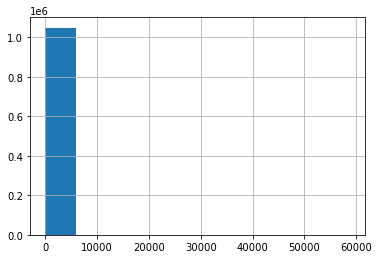

In [10]:
#distribution of duration_in_in
rides.duration_in_min.hist()
rides.duration_in_min.describe()

It seems that most likely the number of data points with a value bigger than the bar is very small but it has some outliers that forces the hist function to pick the scale it does. Our approach to solve this is by trying to remove the outliers. Before that we also see that the describe method returns some values that are not very easy to read. Scientifc notation is the reason for that. We can transform the values by using:

In [11]:
rides.duration_in_min.describe().apply(lambda x: format(x, 'f'))

count    1048468.000000
mean          16.036594
std           97.554947
min            0.016667
25%            6.616667
50%           11.033333
75%           17.916667
max        58771.366667
Name: duration_in_min, dtype: object

Durations like 0.01min (minimum) or 58k min(maximum) seems odd. We get also an idea about the skewness. The median is at 11min and the mean at 16min. So the distribution is probably skewed. While I was checking on the pickup/dropoff locations I had locations which are in the middle of the ocean.  

Next we are checking on distances:

count    1048468.000000
mean           3.442279
std            4.382064
min            0.000000
25%            1.232231
50%            2.094639
75%            3.876902
max         1240.908677
Name: distance, dtype: object

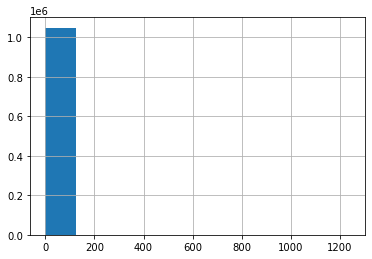

In [12]:
rides.distance.hist()
rides.distance.describe().apply(lambda x: format(x, 'f'))

The 'distance' variable shows a minimum distance of 0 miles and a maximum distance of 1.240 miles. This seems odd as well. The median is around 2miles and the mean around 3.5 miles. So the distribution is also skewed here. The quality of the data is not perfect.

<u>Defining thresholds for outliers and create labels for them</u>

I assume normal distribution for the both variables and work with a confidence interval of 95% (anything bigger than 2-times of standard deviation is defined as outlier). 
In a first step, we need to define a range of values that are ok to work with. 
Next, we want to get rid of heavy outliers. Lets do that by labelling the rides first. 

- Defining threshold

In [13]:
#calculating 2-times standard deviation
distance_conf=rides.distance.std()*2
duration_min_conf=rides.duration_in_min.std()*2

In [14]:
#calculating the 'distance' boundary on the left side from the mean
print('We will calculate the lower threshold for the distance variable')
print(rides.distance.mean()-distance_conf)

#calculating the 'distance' boundary on the right side from the mean
print ('We will calculate now the upper threshold for the distance variable')
distance_thresh=rides.distance.mean()+distance_conf
print(distance_thresh)

We will calculate the lower threshold for the distance variable
-5.321849561636403
We will calculate now the upper threshold for the distance variable
12.206407369630687


In [15]:
#calculating the 'duration_in_min' boundary on the left side from the mean
print('We will calculate the lower threshold for the duration variable in minutes')
print(rides.duration_in_min.mean()-duration_min_conf)

#calculating the 'duration_in_min' boundary on the right side from the mean
print ('We will calculate now the upper threshold for the duration variable in minutes')
duration_min_thresh=rides.duration_in_min.mean()+duration_min_conf
print(duration_min_thresh)

We will calculate the lower threshold for the duration variable in minutes
-179.0733011532639
We will calculate now the upper threshold for the duration variable in minutes
211.14648869928283


In [16]:
#summary of thresholds
print(f'So our cutoff will be at {int(distance_thresh)}miles for the distance and {int(duration_min_thresh)}minutes for the duration. Lets label the rides now')

So our cutoff will be at 12miles for the distance and 211minutes for the duration. Lets label the rides now


- Label Outliers

In [17]:
#labeling outliers in the dataset
rides['outlier'] = np.where((rides.duration_in_min > duration_min_thresh) | (rides.distance > distance_thresh), True, False)

<h5>3.4 Adding information to the dataset</h5>

Our goal is to launch a business. It is therefore important to know what our Total Adressable Market (TAM) is. So, knowledge about prices is very important. This information is not included in the dataset. We will find a workaround for this. 
Another issue comes up as we want to solve the problem of traffic congestion with our service. Therefore it is also interesting to know how much time passengers need for their ride distance. Another metric that can be derived from the dataset is needed. We also can use the new metric later for further analysis. 

<u>Creating a 'price' variable</u>

We were able to check th entire pickup and dropoff locations with <b>Tableau</b>. We could do this also with plotly/dash or bokeh. Please have a look at <b>file 2.2</b> in this repo. Our data shows information about rides in New York. 
For estimating the prices we have done some research:(https://www1.nyc.gov/site/tlc/passengers/taxi-fare.page).
You could spend way more time like the user breemen did on Kaggle (https://www.kaggle.com/breemen/nyc-taxi-fare-data-exploration). Here is our approach for the price:

<em>Formula for calculating the price:</em>
<p>Base Fare + (0.5 Night surcharge + 0.4 per one minute stopped/slow traffic)*Duration in Minute + ((0.5 per 1/5 per mile)*Distance) + (1.0*[Passenger Count])</p>

<em>Further Information for price calculation:</em> 
<p>We simply checked that most of the taxi rides are within the crowded Manhatten area and many rides are eligible for Night Surcharge. There are no Weekday surcharges so I left them out. Extra Charge for Passenger Count is an assumption.</p>

In [18]:
#creating 'price' variable
price_calc=2.5+(0.9*rides.duration_in_min)+((0.5*1/5)*rides.distance)+(1.0*rides.passenger_count)
rides['price']= np.where(rides.duration_in_min != 0, price_calc, 0)

In [19]:
#creating a 'duration-to-distance' ratio
rides['ddratio']=rides.duration_in_min//rides.distance

<h4>4. Prepare Final Dataset and further steps</h4>

Okay, we have done some initial EDA, data cleaning and added some information. Lets tidy up our dataset and only focus on the relevant parts. Thats why we:
 - drop unnecessary columns
 - get rid ouf outliers
 - look if the distribution of 'distance' and 'duration_in_min' looks better now
 - final look on some metrics

In [20]:
#drop unnecessary columns
rides=rides.drop(columns=['vendor_id','store_and_fwd_flag', 'duration', 'Unnamed: 12', 'Unnamed: 13', 'Unnamed: 14'])

In [21]:
#get rid of outliers and rides with a distance of 0; also set the index to value 'id'
rides_new=rides.loc[(rides.outlier == False) & (rides.distance != 0)]
rides_new=rides_new.set_index('id')

count    998679.000000
mean          2.788567
std           2.318053
min           0.000095
25%           1.209053
50%           2.010086
75%           3.523590
max          12.206340
Name: distance, dtype: object


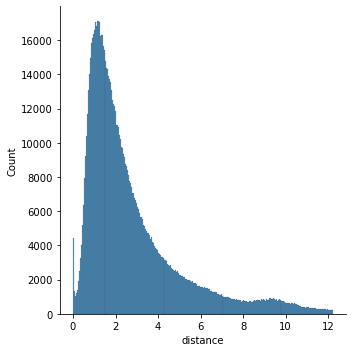

In [22]:
#check distribution of 'distance'
print(rides_new.distance.describe().apply(lambda x: format(x, 'f')))
sns.displot(data=rides_new, x="distance")

count    998679.000000
mean         12.727524
std           8.851330
min           0.016667
25%           6.450000
50%          10.600000
75%          16.716667
max         208.783333
Name: duration_in_min, dtype: object


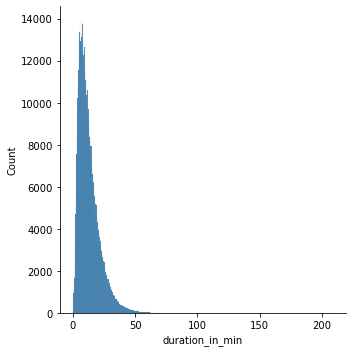

In [23]:
#check distribution of 'duration_in_min'
print(rides_new.duration_in_min.describe().apply(lambda x: format(x, 'f')))
sns.displot(data=rides_new, x="duration_in_min")

In [24]:
#running Pandas Profiling for the new dataset
rides_new_eda = ProfileReport(rides_new)
rides_new_eda

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
#having a look at the new dataset
rides_new.head()

,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,distance,duration_in_min,outlier,price,ddratio
id,,,,,,,,,,,,
id0924324,5/10/16 18:07,5/10/16 18:26,2,-73.959068,40.775661,-73.959068,40.775661,0.000095,18.483333,False,21.135009,194766.0
id3541058,2/27/16 18:20,2/27/16 18:21,1,-74.026512,40.748112,-74.026512,40.748112,0.000095,0.750000,False,4.175009,7903.0
id1154577,5/14/16 14:28,5/14/16 14:39,1,-73.987740,40.748951,-73.987740,40.748951,0.000095,11.783333,False,14.105009,124165.0
id1824340,1/21/16 11:09,1/21/16 11:14,2,-73.948395,40.782394,-73.948395,40.782394,0.000095,5.433333,False,9.390009,57253.0
id1148385,5/26/16 7:39,5/26/16 7:39,1,-73.985252,40.754349,-73.985252,40.754349,0.000095,0.316667,False,3.785009,3336.0


In [26]:
#Lets have a final look on some metrics
rides_new[['passenger_count', 'distance', 'duration_in_min', 'price']].describe()

,passenger_count,distance,duration_in_min,price
count,998679.000000,998679.000000,998679.000000,998679.000000
mean,1.661548,2.788567,12.727524,15.895176
std,1.312925,2.318053,8.851330,8.253205
min,0.000000,0.000095,0.016667,2.530602
25%,1.000000,1.209053,6.450000,10.044561
50%,1.000000,2.010086,10.600000,14.002901
75%,2.000000,3.523590,16.716667,19.703258
max,8.000000,12.206340,208.783333,194.445280


We can continue to analyze the rides and the research data while using Python. We can use plots to see how the metrics look like and customize them:

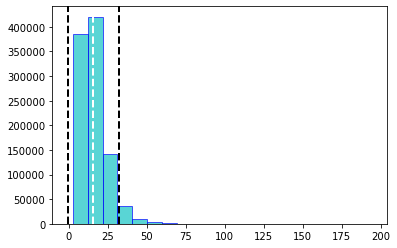

In [27]:
mean= rides_new.price.mean()

_std=rides_new.price.std()
_2stdp=mean+(_std*2)
_2stdn=mean-(_std*2)

plt.axvline(_2stdp, color='k', linestyle='dashed', linewidth=2)
plt.axvline(_2stdn, color='k', linestyle='dashed', linewidth=2)
plt.axvline(mean, color='w', linestyle='dashed', linewidth=2)

plt.hist(rides_new.price, bins=20, color='c', edgecolor='b', alpha=0.65)
plt.show()

But we also can do this by using other BI Tools like Tableau. And thats what we will do as a next step in file 2.2 in this repo. Therefore we just need to extract the final rides_new dataset and import it in Tableau. That can be done with the .to_csv(filepath) method. 